## Loading modules & data

In [1]:
!pip install pytorch-fid > /dev/null
!pip install gdown > /dev/null
!mkdir -p checkpoints

IN_COLAB = False
try:
  get_ipython()
  IN_COLAB = True
except NameError:
  pass
ON_SERVER = False
try:
  import pytorch_fid
except:
  ON_SERVER = True

import abc
import random
import os

import torch
import torchvision
from torchvision import transforms, datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
# import torch.nn.functional as F

import numpy as np
from tqdm import tqdm


if not ON_SERVER:
  from pytorch_fid.fid_score import calculate_frechet_distance, InceptionV3
  import matplotlib.pyplot as plt

# Init
np.random.seed(0)
torch.random.manual_seed(0)

# Constants

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Executing on", device)

BATCH_SIZE = 128
IMG_SIZE = 64
IMG_SHAPE = (IMG_SIZE, IMG_SIZE)
DEFAULT_T = 400

# Data
!gdown --id 14afDKkP885lP3rM0Aeit-vW4LprjQ3g4 -O checkpoints/mnist_model_state.pt
# !wget -nc https://github.com/Master-IASD/assignment2-22-gm-theo_max_chris/raw/main/checkpoints/mnist_model_state.pt  -O checkpoints/mnist_model_state.pt

Executing on cuda
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=14afDKkP885lP3rM0Aeit-vW4LprjQ3g4
To: /content/checkpoints/mnist_model_state.pt
100% 1.01M/1.01M [00:00<00:00, 106MB/s]


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw

70000 training images in MNIST


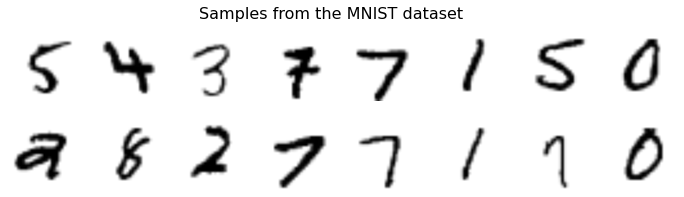

In [2]:
def load_data():
  data_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(), # Scales data into [0,1] 
    transforms.Lambda(lambda t: (t * 2) - 1), # Scale between [-1, 1] 
  ])

  train = datasets.MNIST('./data', train=True, download=True, transform=data_transform)
  test = datasets.MNIST('./data', train=False, download=True, transform=data_transform)
  return torch.utils.data.ConcatDataset([train, test])
  
def show_data_samples(images, n=None, side=1.5, max_by_line=8, title=None, clamp=True):
  n = n or len(images)
  w = min(max_by_line, n)
  h = (n+w-1) // w
  fig, axes = plt.subplots(nrows=h, ncols=w, figsize=(side*w,side*h))
  for l in range(h):
    for c in range(w):
      ax = axes[l,c] if h > 1 else axes[c]
      ax.axis('off')

  samples_ids = sorted(random.sample(range(len(images)), n))
  for i_plot, i_img in enumerate(samples_ids):
    lig, col = i_plot // w, i_plot % w
    img = images[i_img].reshape(IMG_SIZE, IMG_SIZE)
    if clamp:
      img = img.clamp(min=-1, max=1)
    img = img.detach().cpu().numpy()
    ax = axes[lig,col] if h > 1 else axes[col]
    ax.imshow(img, cmap='gray_r')
  
  if title:
    fig.suptitle(title, fontsize=16)
  plt.show()

def sub(dataset, n, sub_device=None):
  if sub_device is None:
    sub_device = device
  samples_ids = random.sample(range(len(dataset)), n)
  return torch.stack([dataset[i][0] for i in samples_ids]).to(sub_device)

def labels21hot(labels):
  return torch.nn.functional.one_hot(labels, num_classes=10).float()

data_source = load_data()
sample_example = sub(data_source, 16)
dataloader = torch.utils.data.DataLoader(data_source, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

if IN_COLAB:
  print(f"{len(data_source)} training images in MNIST")
  show_data_samples(sample_example, title="Samples from the MNIST dataset")

## Noise model

In [3]:
class NoiseModel(abc.ABC):
  def __init__(self, T=None, dims=3):
    self.T = DEFAULT_T if T is None else T 

    # 0 to T, index 0 having the value 0
    self.beta = torch.cat([torch.tensor([0]), self.schedule_beta()]).to(device)
    self.beta = self.beta[(...,)+(None,)*dims]
    self.beta_sum = torch.cumsum(self.beta, axis=0)
    self.alpha = 1. - self.beta
    self.alpha_prod = torch.cumprod(self.alpha, axis=0)
    one_mins_alpham1 = torch.cat([self.beta[:1], 1-self.alpha_prod[1:]])
    self.beta_tilde = one_mins_alpham1 / (1-self.alpha_prod) * self.beta
  
  @abc.abstractmethod
  def schedule_beta(self):
    pass
  
  def add_noise(self, x0, t, noise=None, sigma=None):
    if noise is None:
      noise = torch.randn_like(x0, device=x0.device)
    if sigma is None:
      sigma = torch.sqrt(1 - self.alpha_prod[t])
    if len(sigma.shape) <= len(x0.shape)-2:
      dims = len(x0.shape) - len(sigma.shape)
      sigma = sigma[(...,)+(None,)*dims]
    
    mean = torch.sqrt(self.alpha_prod[t]) * x0
    return noise, mean + noise * sigma
  
  def add_sample_noise(self, xtm1, sigma, noise=None):
    if noise is None:
      noise = torch.randn_like(xtm1, device=xtm1.device)
    if len(sigma.shape) <= len(xtm1.shape)-2:
      dims = len(xtm1.shape) - len(sigma.shape)
      sigma = sigma[(...,)+(None,)*dims]
    assert len(sigma.shape) == len(noise.shape)
    assert xtm1.shape == noise.shape
    return noise, xtm1 + noise * sigma
  
  def invert_noise_step(self, xt, t, noise, added_noise=None):
    noise_scale = self.beta[t] / torch.sqrt(1 - self.alpha_prod[t])
    x_pred = (xt - noise * noise_scale) / torch.sqrt(self.alpha[t])
    if added_noise is not None:
      _, x_pred = self.add_sample_noise(xt, sigma=added_noise)
    return x_pred
  
  def predict_x0(self, xt, t, noise):
    return (xt - torch.sqrt(1 - self.alpha_prod[t]) * noise) / torch.sqrt(self.alpha_prod[t])

class LinearNoise(NoiseModel):
  def __init__(self, *args, beta_min=0.0001, beta_max=0.02, **kwargs):
    self.beta_min = beta_min
    self.beta_max = beta_max

    super().__init__(*args, **kwargs)
  
  def schedule_beta(self):
    return torch.linspace(self.beta_min, self.beta_max, self.T)

class QuadraticNoise(LinearNoise):
  def schedule_beta(self):
    return torch.square(torch.linspace(self.beta_min**0.5, self.beta_max**0.5, self.T))

class CosineNoise(NoiseModel):
  def __init__(self, *args, s=0.008, **kwargs):
    self.s = s
    super().__init__(*args, **kwargs)

  def schedule_beta(self):
    t_vals = torch.arange(0, self.T+1, dtype=torch.float)
    ft = torch.cos( torch.pi / 2 * (t_vals/self.T+self.s)/(1+self.s) )
    alpha_t = ft / ft[0]
    beta_t = 1 - alpha_t[1:] / alpha_t[:-1]
    return torch.clip(beta_t, max=0.999)

class SigmoidNoise(LinearNoise):
  def schedule_beta(self):
    beta_t = torch.linspace(-6, 6, self.T)
    return torch.sigmoid(beta_t) * (self.beta_max - self.beta_min) + self.beta_min

In [4]:
def show_noisy_images(noise_model, sample_example, n_steps, n_samples):
  samples_with_noise = []
  for i_sample in range(n_samples):
    for t in map(round, np.linspace(1, noise_model.T, n_steps)):
      _, noisy_sample = noise_model.add_noise(sample_example[i_sample], t)
      samples_with_noise.append(noisy_sample)
  show_data_samples(
    samples_with_noise,
    title=f"Samples with noise level from 0 to {noise_model.T} with {noise_model.__class__.__name__}",
    max_by_line=n_steps
  )

def show_noise_curves_and_samples(T, **noise_models):
  t_T = np.linspace(0,1,T+1)
  for name, model in noise_models.items():
    alpha = model.alpha_prod.cpu().numpy().reshape(-1)
    plt.plot(t_T, alpha, label=name)

  plt.xlabel('t/T')
  alpha_overline = b'\xce\xb1\xcc\x85'.decode('utf-8')
  plt.ylabel(f'{alpha_overline} t')
  plt.grid()
  plt.legend()
  plt.show()

  for name, model in noise_models.items():
    print(f"Show noise {name}")
    show_noisy_images(model, sample_example, n_steps=12, n_samples=3)

if IN_COLAB:
  TEST_T = DEFAULT_T
  show_noise_curves_and_samples(TEST_T,
    linear=LinearNoise(TEST_T),
    quadratic=QuadraticNoise(TEST_T),
    cosine=CosineNoise(TEST_T),
    sigmoid=SigmoidNoise(TEST_T),
  )

Output hidden; open in https://colab.research.google.com to view.

# Discriminator

In [5]:
# Trained in my other notebook https://colab.research.google.com/drive/1txwe43o9jDVUMPQFGt9baMmESviw40Jo
class Discriminator(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Sequential(
      nn.Conv2d(1, 32, 5, padding=2),
      nn.ReLU(),
      nn.BatchNorm2d(32),
      nn.Conv2d(32, 32, 5, stride=2, padding=2),
      nn.ReLU(),
      nn.BatchNorm2d(32),
      nn.Conv2d(32, 32, 5, padding=2),
      nn.ReLU(),
      nn.BatchNorm2d(32),
      nn.Conv2d(32, 32, 5, stride=2, padding=2),
      nn.ReLU(),
      nn.BatchNorm2d(32),
      nn.MaxPool2d(2, 2),
      nn.Dropout(0.25)
    )
    self.conv2 = nn.Sequential(
      nn.Conv2d(32, 64, 3, padding=1),
      nn.ReLU(),
      nn.BatchNorm2d(64),
      nn.Conv2d(64, 64, 3, padding=1),
      nn.ReLU(),
      nn.BatchNorm2d(64),
      nn.Conv2d(64, 64, 3, stride=2, padding=1),
      nn.ReLU(),
      nn.BatchNorm2d(64),
      nn.MaxPool2d(2, 2),
      nn.Dropout(0.25)
    )
    self.conv3 = nn.Sequential(
      nn.Conv2d(64, 128, 3, padding=1),
      nn.ReLU(),
      nn.BatchNorm2d(128),
      nn.MaxPool2d(2, 2),
      nn.Dropout(0.25)
    )
    self.fc = nn.Sequential(
      nn.Flatten(),
      nn.Linear(128, 10)
    )
  def forward(self, x):
    if x.shape[0] != 64:
      x = torch.nn.functional.interpolate(x, (64, 64))
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = self.fc(x)
    x = F.log_softmax(x, dim=1)
    return x

discriminator = Discriminator()
discriminator.load_state_dict(torch.load('checkpoints/mnist_model_state.pt', map_location=device))
discriminator.to(device)
discriminator = discriminator.eval()

# Model architectures
All the models below should generate an output of the same shape as the input, with both input and output values in the $[-1;1]$ range.

In [6]:
class DenoisingModel(nn.Module, abc.ABC):
  def __init__(self, shape=None):
    super().__init__()
    self.shape = shape or IMG_SHAPE
  
  def num_params(self):
    return sum(p.numel() for p in self.parameters())

class SinTimeEmbedding(nn.Module):
  def __init__(self, time_dim, out_dim):
    super().__init__()
    self.time_dim = time_dim

    self.time_mlp = nn.Sequential(
      nn.Linear(time_dim*2, out_dim),
      nn.GELU(),
      nn.Linear(out_dim, out_dim),
    )

  def forward(self, time):
    decreasing_embeddings = torch.exp(
      torch.arange(self.time_dim, device=device)
      * -np.log(10000) / (self.time_dim - 1)
    )
    embeddings = time.reshape(-1, 1) * decreasing_embeddings
    sin_embeddings = torch.cat([
        torch.sin(embeddings),
        torch.cos(embeddings),
    ], dim=-1)

    time_embeddings = self.time_mlp(sin_embeddings)
    return time_embeddings
  
class DenoisingModelTimeEmb(DenoisingModel):
  def __init__(self, *args, time_out_dim, time_emb_dim=128, **kwargs):
    super().__init__(*args, **kwargs)
    self.time_out_dim = time_out_dim
    self.time_emb_dim = time_emb_dim
    self.time_emb = SinTimeEmbedding(time_emb_dim, time_out_dim)

### Simple convolutional network

In [7]:
class SimpleConvDenoiser(DenoisingModelTimeEmb):
  def __init__(self, *args, base_chans=16, **kwargs):
    c = base_chans

    super().__init__(*args, time_out_dim=c*2, **kwargs)
    assert len(self.shape) == 2 # We work on images
  
    kernel_size = 5
    stride = 2
    pdg, opdg = kernel_size // 2, kernel_size % 2

    self.net1 = nn.Sequential(
      nn.Conv2d(1, c, kernel_size, padding=pdg, stride=stride),
      nn.Tanh(),
      nn.Conv2d(c, c*2, kernel_size, padding=pdg, stride=stride),
      nn.Tanh(),
    )
    self.net2 = nn.Sequential(
      nn.ConvTranspose2d(c*2, c, kernel_size, padding=pdg, stride=stride, output_padding=opdg),
      nn.Tanh(),
      nn.ConvTranspose2d(c, 1, kernel_size, padding=pdg, stride=stride, output_padding=opdg),
      nn.Tanh(),
    )
  
  def forward(self, x, timestep, labels):
    # Time embeding, extend the last 2 dimensions
    t_emb = self.time_emb(timestep)
    t_emb = t_emb[(..., None, None)]

    # Convolutional network
    x1 = self.net1(x)
    x1_t = x1 + t_emb
    x2 = self.net2(x1_t)
    return x2

### VAE


In [8]:
class Variationalautoencoder2(DenoisingModelTimeEmb):
  def __init__(self, *args, end_skip=False, embeding_dim=16, **kwargs):
    super().__init__(*args, time_out_dim=128, **kwargs)

    kernel_size = 5
    pdg, opdg = kernel_size // 2, kernel_size % 2
    self.embeding_dim = embeding_dim
    self.end_skip = end_skip

    self.image_encoder = nn.Sequential( # _, C, 64, 64
      nn.Conv2d(1, 8, kernel_size, stride=2, padding=pdg),
      nn.Tanh(), # _, C, 32, 32
      nn.Conv2d(8, 16, kernel_size, stride=2, padding=pdg),
      nn.BatchNorm2d(16),
      nn.Tanh(), # _, C, 16, 16
      nn.Conv2d(16, 32, kernel_size, stride=2, padding=pdg),
      nn.Tanh(), # _, C, 8, 8
      nn.Conv2d(32, 64, 3, stride=2, padding=1),
      nn.Tanh(), # _, C, 4, 4
      nn.Conv2d(64, 64, 3, stride=2, padding=1),
      nn.Tanh(), # _, C, 2, 2
      
      nn.Flatten(start_dim=1),
      nn.Linear(2 * 2 * 64, 128),
      nn.Tanh(),
    )
    self.timed_encoder = nn.Sequential(
      nn.Linear(128 + self.time_out_dim, self.embeding_dim),
      nn.Tanh(),
    )

    self.linear2 = nn.Linear(16,128)
    self.linear3 = nn.Linear(16,128)
    
    self.decoder = nn.Sequential(
      nn.Linear(128, 128),
      nn.Tanh(),
      nn.Linear(128, 2 * 2 * 64),
      nn.Tanh(),
      nn.Unflatten(dim=1, unflattened_size=(64, 2, 2)),

      nn.ConvTranspose2d(64, 64, 3, stride=2, padding=1, output_padding=1),
      nn.Tanh(),
      nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
      nn.Tanh(),
      nn.ConvTranspose2d(32, 16, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
      nn.ConvTranspose2d(16, 8, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
      nn.ConvTranspose2d(8, 8, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
    )

    self.N = torch.distributions.Normal(0, 1)
    self.N.loc = self.N.loc.cuda() 
    self.N.scale = self.N.scale.cuda()
    self.kl = 0

    if end_skip:
      self.denoiser_end = nn.Sequential(
        nn.Conv2d(9, 16, kernel_size, padding=pdg),
        nn.Tanh(),
        nn.Conv2d(16, 8, kernel_size, padding=pdg),
        nn.Tanh(),
        nn.Conv2d(8, 1, kernel_size, padding=pdg),
      )
    else:
      self.denoiser_end = nn.Sequential(
        nn.Conv2d(8, 1, kernel_size, padding=pdg),
      )

  def decode(self, x_lattent):
    if self.end_skip:
      raise Exception("Can't use decode when end_skip is True")
    return self.denoiser_end(self.decoder(x_lattent))
  
  def forward(self, x, timestep, labels):
    t_emb = self.time_emb(timestep) * 1e-1

    x1 = self.image_encoder(x)
    x1_t = torch.cat([x1, t_emb], axis=-1)
    x1_t = self.timed_encoder(x1_t)
    mu =  self.linear2(x1_t)
    sigma = torch.exp(self.linear3(x1_t))
    z = mu + sigma*self.N.sample(mu.shape)
    self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()

    x2 = self.decoder(z)

    if self.end_skip:
      x2 = torch.cat([x, x2], -3)
    x3 = self.denoiser_end(x2)
    return x3

def train_variationalautoencoder(vae_net, epochs=5):
  vae_net = vae_net.to(device)
  train_losses = []
  optimizer = torch.optim.Adam(vae_net.parameters(), lr=1e-3, weight_decay=1e-05)
  loss_crit = nn.MSELoss()
  for i_epoch in range(epochs):
    for step, (x0_batch, _) in enumerate(dataloader):
      optimizer.zero_grad()
      x0_batch = x0_batch.to(device)
      
      timesteps = torch.randint(1, 1000, (len(x0_batch),), device=device)
      pred = vae_net(x0_batch, timesteps)
      loss = loss_crit(pred, x0_batch) + vae_net.kl
      
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())

      if step % 200 == 0:
        print(f"Epoch {i_epoch} | step {step}/{len(dataloader)} | loss {loss.item():.8f}")
        rand_x = torch.rand((8, vae_net.embeding_dim)).to(device)
        # rand_x = sub(data_source, 8).to(device)
        # t = torch.randint(1, 1000, (len(rand_x),), device=device)
        pred_y = vae_net.decode(rand_x)
        show_data_samples(pred_y)
  plt.plot(train_losses)
  plt.show()
#train_variationalautoencoder(Variationalautoencoder2(), 15)

### Autoencoder

In [9]:
class Autoencoder(DenoisingModelTimeEmb):
  def __init__(self, *args, end_skip=False, embeding_dim=16, **kwargs):
    super().__init__(*args, time_out_dim=128, **kwargs)

    kernel_size = 5
    pdg, opdg = kernel_size // 2, kernel_size % 2
    self.embeding_dim = embeding_dim
    self.end_skip = end_skip

    self.image_encoder = nn.Sequential( # _, C, 64, 64
      nn.Conv2d(1, 8, kernel_size, stride=2, padding=pdg),
      nn.Tanh(), # _, C, 32, 32
      nn.Conv2d(8, 16, kernel_size, stride=2, padding=pdg),
      nn.BatchNorm2d(16),
      nn.Tanh(), # _, C, 16, 16
      nn.Conv2d(16, 32, kernel_size, stride=2, padding=pdg),
      nn.Tanh(), # _, C, 8, 8
      nn.Conv2d(32, 64, 3, stride=2, padding=1),
      nn.Tanh(), # _, C, 4, 4
      nn.Conv2d(64, 64, 3, stride=2, padding=1),
      nn.Tanh(), # _, C, 2, 2
      
      nn.Flatten(start_dim=1),
      nn.Linear(2 * 2 * 64, 128),
      nn.Tanh(),
    )
    self.timed_encoder = nn.Sequential(
      nn.Linear(128 + self.time_out_dim, self.embeding_dim),
      nn.Tanh(),
    )
    self.decoder = nn.Sequential(
      nn.Linear(self.embeding_dim, 128),
      nn.Tanh(),
      nn.Linear(128, 2 * 2 * 64),
      nn.Tanh(),
      nn.Unflatten(dim=1, unflattened_size=(64, 2, 2)),

      nn.ConvTranspose2d(64, 64, 3, stride=2, padding=1, output_padding=1),
      nn.Tanh(),
      nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
      nn.Tanh(),
      nn.ConvTranspose2d(32, 16, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
      nn.ConvTranspose2d(16, 8, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
      nn.ConvTranspose2d(8, 8, kernel_size, stride=2, padding=pdg, output_padding=opdg),
      nn.Tanh(),
    )
    if end_skip:
      self.denoiser_end = nn.Sequential(
        nn.Conv2d(9, 16, kernel_size, padding=pdg),
        nn.Tanh(),
        nn.Conv2d(16, 8, kernel_size, padding=pdg),
        nn.Tanh(),
        nn.Conv2d(8, 1, kernel_size, padding=pdg),
      )
    else:
      self.denoiser_end = nn.Sequential(
        nn.Conv2d(8, 1, kernel_size, padding=pdg),
      )

  def decode(self, x_lattent):
    if self.end_skip:
      raise Exception("Can't use decode when end_skip is True")
    return self.denoiser_end(self.decoder(x_lattent))
  
  def forward(self, x, timestep, labels):
    t_emb = self.time_emb(timestep) * 1e-1

    x1 = self.image_encoder(x)
    x1_t = torch.cat([x1, t_emb], axis=-1)
    x1_t = self.timed_encoder(x1_t)
    x2 = self.decoder(x1_t)

    if self.end_skip:
      x2 = torch.cat([x, x2], -3)
    x3 = self.denoiser_end(x2)
    return x3

def train_autoencoder(ae_net, epochs=5):
  ae_net = ae_net.to(device)
  train_losses = []
  optimizer = torch.optim.Adam(ae_net.parameters(), lr=1e-3, weight_decay=1e-05)
  loss_crit = nn.MSELoss()
  for i_epoch in range(epochs):
    for step, (x0_batch, _) in enumerate(dataloader):
      optimizer.zero_grad()
      x0_batch = x0_batch.to(device)
      
      timesteps = torch.randint(1, 1000, (len(x0_batch),), device=device)
      pred = ae_net(x0_batch, timesteps)
      loss = loss_crit(pred, x0_batch)
      
      loss.backward()
      optimizer.step()
      train_losses.append(loss.item())

      if step % 200 == 0:
        print(f"Epoch {i_epoch} | step {step}/{len(dataloader)} | loss {loss.item():.8f}")
        rand_x = torch.rand((8, ae_net.embeding_dim)).to(device)
        # rand_x = sub(data_source, 8).to(device)
        # t = torch.randint(1, 1000, (len(rand_x),), device=device)
        pred_y = ae_net.decode(rand_x)
        show_data_samples(pred_y)
  plt.plot(train_losses)
  plt.show()
# train_autoencoder(Autoencoder(), 15)

### U-Net

In [10]:
class UBlock(nn.Module):
  def __init__(self, in_ch, out_ch, time_out_dim, kernel_size=3, b_norm=False):
    super().__init__()
    self.in_ch, self.out_ch = in_ch, out_ch
    self.kernel_size = kernel_size
    self.pdg, self.opdg = kernel_size // 2, kernel_size % 2
    self.time_out_dim = time_out_dim

    self.time_mlp = nn.Sequential(
      nn.Linear(time_out_dim, out_ch),
      nn.Tanh(),
    )
    self.block_start = nn.Sequential(*(
      [nn.Conv2d(in_ch, out_ch, self.kernel_size, padding=self.pdg),
      nn.ReLU()]
      + ([nn.BatchNorm2d(out_ch)] if b_norm else [])
    ))
    
    self.block_end = nn.Sequential(
      nn.Conv2d(out_ch*2, out_ch, self.kernel_size, padding=self.pdg),
      nn.ReLU(),
    )
    
  def forward(self, x, t):
    x_mid = self.block_start(x)
    t_emb = self.time_mlp(t)

    t_emb = t_emb[..., None, None].broadcast_to((x.shape[0], self.out_ch, x.shape[-2], x.shape[-1]))
    xt_mid = torch.cat([x_mid, t_emb], axis=1)
    
    return self.block_end(xt_mid)

class DownUBlock(UBlock):
  def __init__(self, *args, **kwargs):
    super().__init__(*args, **kwargs)
    self.downsampler = nn.Sequential(
      nn.Conv2d(self.out_ch, self.out_ch, self.kernel_size, padding=self.pdg, stride=2),
      nn.ReLU(),
    )
  
  def forward(self, x, t):
    x_out = super().forward(x, t)
    return x_out, self.downsampler(x_out)

class UpUBlock(UBlock):
  def __init__(self, in_ch, out_ch, *args, residual_dim='auto', **kwargs):
    if residual_dim == 'auto':
      residual_dim = out_ch
    super().__init__(out_ch + residual_dim, out_ch, *args, **kwargs)
    self.upsampler = nn.Sequential(
      # nn.BatchNorm2d(in_ch),
      nn.ConvTranspose2d(in_ch, out_ch, self.kernel_size, stride=2, padding=self.pdg, output_padding=self.opdg),
      nn.ReLU(),
    )
  
  def forward(self, x, residual_x, t):
    x = self.upsampler(x)
    assert x.shape == residual_x.shape
    x = torch.cat([x, residual_x], axis=1)
    return super().forward(x, t)


class Unet(DenoisingModelTimeEmb):
  def __init__(self, channels, *args, using_labels=True, **kwargs):
    super().__init__(*args, **kwargs)
    self.using_labels = using_labels
    first_ch = channels[0]
    kernel_size = 3

    # Downsampling
    self.downs = nn.ModuleList([
      DownUBlock(prev_chans, next_chans, self.time_out_dim, kernel_size,
        b_norm=(prev_chans == 0) # Batch norm on first block
      )
      for prev_chans, next_chans in zip([1] + channels[:-2], channels[:-1])
    ])

    mid_ch = channels[-2]
    self.mid_b_norm = nn.BatchNorm2d(mid_ch)

    if self.using_labels:
      self.label_mlp = nn.Sequential(
        nn.Linear(10, mid_ch),
        nn.Tanh(),
      )
      mid_ch *= 2
    self.mid_block = UBlock(mid_ch, channels[-1], self.time_out_dim, kernel_size)

    # Upsampled
    self.ups = nn.ModuleList([
      UpUBlock(prev_chans, next_chans, self.time_out_dim, kernel_size)
      for prev_chans, next_chans in zip(channels[:0:-1], channels[-2::-1])
    ])

    # self.end_block = UBlock(first_ch+1, first_ch, self.time_out_dim, kernel_size, b_norm=False)
    self.end_fct = nn.Sequential(
      nn.Conv2d(first_ch, 1, 1),
    )

  def forward(self, x, timestep, labels):
    t_emb = self.time_emb(timestep)
    img_input = x
    
    # Unet
    residual_inputs = []
    for down in self.downs:
      res_x, x = down(x, t_emb)
      residual_inputs.append(res_x)
    x = self.mid_b_norm(x)
    if self.using_labels:
      label_emb = self.label_mlp(labels21hot(labels))
      label_emb = label_emb[...,None,None].broadcast_to(x.shape)
      x = torch.cat([x, label_emb], axis=1)
    x = self.mid_block(x, t_emb)
    for up in self.ups:
      res_x = residual_inputs.pop()        
      x = up(x, res_x, t_emb)

    y = x
    # y = torch.cat([y, img_input], axis=1)
    # y = self.end_block(y, t_emb)
    y = self.end_fct(y)
    return y

# Diffusion model
Joint architechtures

In [11]:
class DiffusionModel(abc.ABC):
  def __init__(self, noise_model, denoiser, loss='l2', sampling_noise=None):
    self.noise_model = noise_model
    self.denoiser = denoiser.to(device)
    if loss == 'l2':
      self.loss_crit = nn.MSELoss()
    elif loss == 'l1':
      self.loss_crit = nn.SmoothL1Loss()
    else:
      raise ValueError(f"No loss named {loss}")

    self.T = self.noise_model.T
    self.sampling_noise = sampling_noise
  
  def save(self, name):
    torch.save(self.denoiser.state_dict(), 'checkpoints/' + name + '.pt')
  
  def load(self, name):
    self.denoiser.load_state_dict(
      torch.load('checkpoints/' + name + '.pt', map_location=device),
    )
  
  def sample_noisy_x(self, n_samples=None):
    n = 1 if n_samples is None else n_samples
    x = torch.randn((n, 1) + self.denoiser.shape, device=device)
    return x[0] if n_samples is None else x
  
  def sample_xt_labels(self, n_samples):
    xt = self.sample_noisy_x(n_samples)
    labels = torch.randint(10, (len(xt),)).to(xt.device)
    return xt, labels
  
  @abc.abstractmethod
  def loss_at_step(self, x0, timesteps, labels):
    pass
  
  @abc.abstractmethod
  def denoise_single_step(self, xt, timesteps, labels):
    pass
  
  def add_sampling_noise(self, xtm1, from_t):
    if self.sampling_noise is not None:
      if self.sampling_noise == 'beta':
        sigma = torch.sqrt(self.noise_model.beta[from_t])
      elif self.sampling_noise == 'beta_tilde':
        sigma = torch.sqrt(self.noise_model.beta_tilde[from_t])
      elif isinstance(self.sampling_noise, float):
        sigma = self.sampling_noise * torch.sqrt(self.noise_model.beta[from_t])
      else:
        raise ValueError(f"Unknown sampling noise {self.sampling_noise}")
      tg1 = (from_t>1)[...,None,None,None]
      assert tg1.shape == sigma.shape
      _, xtm1 = self.noise_model.add_sample_noise(xtm1, sigma=sigma*tg1)
    return xtm1
  
  @torch.no_grad()
  def denoise_steps(self, x, labels, from_t=None, to_t=0):
    if from_t is None:
      from_t = self.T
    
    pred_steps = [x]
    for timestep in range(from_t, to_t, -1):
      timestep = torch.ones(len(x), device=x.device, dtype=int) * timestep
      xtm1 = self.denoise_single_step(pred_steps[-1], timestep, labels)
      xtm1 = self.add_sampling_noise(xtm1, timestep)
      pred_steps.append(xtm1)
    pred_steps = [x.clamp(min=-1, max=1) for x in pred_steps]
    return pred_steps
  
  @torch.no_grad()
  def denoise(self, x=None, labels=None, *args, **kwargs):
    if labels is None:
      labels = torch.randint(10, (len(x),)).to(x.device)
    return self.denoise_steps(x, labels, *args, **kwargs)[-1]

  @torch.no_grad()
  def show_generated_sample(self, n=1, shown_steps=10):
    xT = self.sample_noisy_x(n)
    label = torch.randint(10, (len(xT),)).to(device)
    pred_steps = self.denoise_steps(xT, label)
    steps_ids = np.linspace(0, len(pred_steps)-1, shown_steps, dtype=int).tolist()
    show_data_samples(
      [pred_steps[s][i] for i in range(n) for s in steps_ids],
      max_by_line=shown_steps,
      title=f'Generated samples for labels {label.cpu().numpy().tolist()}'
    )
  
  def train(self, data, epochs, optimizer, lr, log_interval=100):
    optimizer = optimizer(self.denoiser.parameters(), lr=lr)

    train_losses = []
    for i_epoch in range(epochs):
      for step, (x0_batch, label_batch) in enumerate(tqdm(data, desc='Training')):
        optimizer.zero_grad()
        x0_batch = x0_batch.to(device)
        label_batch = label_batch.to(device)
        
        timesteps = torch.randint(1, self.T, (len(x0_batch),), device=device)
        loss = self.loss_at_step(x0_batch, timesteps, label_batch)
        
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

        if log_interval and step % log_interval == 0:
          print(f"\nEpoch {i_epoch+1} | step {step}/{len(data)} | loss {loss.item():.8f}")
          self.show_generated_sample()
    return train_losses

## Denoising Diffusion Probabilistic Models
From [Denoising Diffusion Probabilistic Models, Ho et al. (2020)](https://arxiv.org/abs/2006.11239)

In [12]:
class AvgDDPM(DiffusionModel):
  """This version the DDPM tries to predict µ directly"""
  def loss_at_step(self, x0, timesteps, labels):
    noise, xt = self.noise_model.add_noise(x0, timesteps)
    pred = self.denoiser(xt, timesteps, labels)

    xt_minus1 = self.noise_model.invert_noise_step(xt, timesteps, noise)
    return self.loss_crit(xt_minus1, pred)
  
  def denoise_single_step(self, xt, timesteps, labels):
    return self.denoiser(xt, timesteps, labels)

class EpsDDPM(DiffusionModel):
  """This version the DDPM tries to predict εθ"""
  def __init__(self, *args, discriminator=None, cls_coeff=1e-2, **kwargs):
    super().__init__(*args, **kwargs)
    self.discriminator = discriminator
    if self.discriminator is not None:
      self.discriminator.eval()
      self.discriminator.requires_grad_(False)
      self.cls_coeff = cls_coeff
      self.cls_loss = nn.CrossEntropyLoss()

  def loss_at_step(self, x0, timesteps, labels):
    noise, xt = self.noise_model.add_noise(x0, timesteps)
    pred_noise = self.denoiser(xt, timesteps, labels)
    loss = self.loss_crit(noise, pred_noise)

    if self.discriminator is not None:
      pred_x0 = self.noise_model.predict_x0(xt, timesteps, pred_noise)
      cls_pred = self.discriminator(pred_x0)
      cls_loss = self.cls_loss(cls_pred, labels)
      loss = loss + cls_loss * self.cls_coeff

    return loss
  
  def denoise_single_step(self, xt, timesteps, labels):
    pred_noise = self.denoiser(xt, timesteps, labels)
    return self.noise_model.invert_noise_step(xt, timesteps, pred_noise)

## Denoising Diffusion Implicit Models
From [Denoising Diffusion Implicit Models, Song et al. (2022)](https://arxiv.org/abs/2010.02502)

In [13]:
class DDIM(EpsDDPM):
  def __init__(self, *args, num_denoise_steps, **kwargs):
    super().__init__(*args, **kwargs)
    if isinstance(num_denoise_steps, int):
      assert 1 <= num_denoise_steps <= self.T
      self.num_denoise_steps = num_denoise_steps
    elif isinstance(num_denoise_steps, float):
      assert 1/self.T <= num_denoise_steps <= 1
      self.num_denoise_steps = round(num_denoise_steps * self.T)
    else:
      raise ValueError(f"Invalid value for num_denoise_steps={num_denoise_steps}")
    
    assert self.sampling_noise is None, "sampling_noise not supported yet"
  
  @classmethod
  def from_model(cls, prev_model, num_denoise_steps):
    assert isinstance(prev_model, EpsDDPM)
    return cls(
      num_denoise_steps,
      noise_model=prev_model.noise_model,
      denoiser=prev_model.denoiser
    )
  
  def denoise_single_step(self, xt1, t1, t2, labels):
    pred_noise = self.denoiser(xt1, t1, labels)
    pred_x0 = self.noise_model.predict_x0(xt1, t1, pred_noise)
    _, xt2 = self.noise_model.add_noise(pred_x0, t2, pred_noise)
    assert xt2.shape == xt1.shape
    return xt2

    return self.noise_model.invert_noise_step(xt1, t1, pred_noise)

  @torch.no_grad()
  def denoise_steps(self, x, labels):    
    pred_steps = [x]
    steps = np.linspace(self.T, 0, self.num_denoise_steps+1).astype(int)
    for t1, t2 in zip(steps[:-1], steps[1:]):
      t1 = torch.ones(len(x), device=x.device, dtype=int) * t1
      t2 = torch.ones(len(x), device=x.device, dtype=int) * t2
      pred_steps.append(self.denoise_single_step(pred_steps[-1], t1, t2, labels))
    
    pred_steps = [x.clamp(min=-1, max=1) for x in pred_steps]
    return pred_steps

## Sub-sampling T

In [14]:
class EpsDDPMSubTimeSampling(DDIM):
  def denoise_single_step(self, xt1, t1, t2, labels):
    pred_noise = self.denoiser(xt1, t1, labels)
    nm = self.noise_model

    # beta = nm.beta_sum[t1] - nm.beta_sum[t2]
    alpha = nm.alpha_prod[t1] / nm.alpha_prod[t2]
    beta = 1-alpha
    noise_scale = beta / torch.sqrt(1 - nm.alpha_prod[t1])
    x_pred = (xt1 - pred_noise * noise_scale) / torch.sqrt(alpha)

    return x_pred

# Training and experiments

## Models defined and trained

In [15]:
def load_unet_base(v=1):
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load(f'unet-ddpm{v}')
  return model

def load_unet_large():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([32, 64, 128, 256], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-large-1')
  return model

def load_unet_small():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([8, 16, 32, 64], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-small-2')
  return model

def load_unet_l1():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
    loss='l1',
  )
  model.load('unet-l1-ddpm2')
  return model

def load_unet_no_discriminator():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
  )
  model.load('unet-noD-1')
  return model

def load_unet_no_discriminator_no_labels():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64, using_labels = False),
  )
  model.load('unet-noD-noL-1')
  return model

def load_unet_with_discriminator_no_labels():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64, using_labels = False),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-D-noL-1')
  return model

def load_unet_D_coeff(str_coeff):
  assert str_coeff in ['1e-3']
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = float(str_coeff),
  )
  model.load(f'unet-D{str_coeff}-1')
  return model

def load_unet_deeper1():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([8, 16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-deeper1-1')
  return model

def load_unet_deeper2():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128, 256], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-deeper2-1')
  return model

def load_unet_deeper3():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-deeper3-1')
  return model

def load_unet_shallow():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-shallow-1')
  return model

def load_unet_Ltemb():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=256, time_out_dim=128),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-Ltemb-1')
  return model

def load_unet_Stemb():
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=64, time_out_dim=32),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-Stemb-1')
  return model

def load_unet_noiseQuad():
  model = EpsDDPM(
    noise_model = QuadraticNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=64, time_out_dim=32),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-noiseQuad-1')
  return model

def load_unet_noiseCos():
  model = EpsDDPM(
    noise_model = CosineNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-noiseCos-1')
  return model

def load_unet_noiseSigmoid():
  model = EpsDDPM(
    noise_model = SigmoidNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load('unet-noiseSigmoid-1')
  return model

def load_unet_T(T, v=1):
  assert T in [200, 400, 450, 500, 1000]
  model = EpsDDPM(
    noise_model = LinearNoise(T=T),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
  )
  model.load(f'unet-T{T}-{v}')
  return model

def load_unet_noise(noise, v=1):
  assert noise in ['beta', 'beta_tilde']
  model = EpsDDPM(
    noise_model = LinearNoise(T=400),
    denoiser = Unet([16, 32, 64, 128], time_emb_dim=128, time_out_dim=64),
    discriminator=discriminator, cls_coeff = 1e-2,
    sampling_noise=noise,
  )
  # model.load(f'unet-sampling-noise-{noise}-{v}')
  model.load(f'unet-T400-{v}')
  return model

## Experiment functions

In [16]:
"""
  Code to compute FID
  The code below is adapted from https://github.com/mseitzer/pytorch-fid/blob/master/src/pytorch_fid/fid_score.py
  in order to compute the FID on the data directly, without storing and loading them again
"""
@torch.no_grad()
def get_activations(dataset, model, batch_size=50, dims=2048, device='cpu', num_workers=1):
  model.eval()
  assert batch_size <= len(dataset)
  dataloader = torch.utils.data.DataLoader(
    dataset.cpu(), batch_size=batch_size, shuffle=False, drop_last=False, num_workers=num_workers
  )
  pred_arr = np.empty((len(dataset), dims))
  start_idx = 0

  for batch in tqdm(dataloader, desc='Evaluating on dataset'):
    batch = batch.to(device)
    pred = model(batch)[0]

    # If model output is not scalar, apply global spatial average pooling.
    # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
      pred = F.adaptive_avg_pool2d(pred, output_size=(1, 1))

    pred = pred.squeeze(3).squeeze(2).cpu().numpy()
    pred_arr[start_idx:start_idx + pred.shape[0]] = pred
    start_idx = start_idx + pred.shape[0]

  return pred_arr

def calculate_activation_statistics(dataset, *args, **kwargs):
  dataset = torch.cat([dataset, dataset, dataset], axis=1) # RGB

  act = get_activations(dataset, *args, **kwargs)
  mu = np.mean(act, axis=0)
  sigma = np.cov(act, rowvar=False)
  return mu, sigma

def calculate_fid_given_data(datasets, batch_size, device, dims, num_workers=1):
  """Calculates the FID of two paths"""
  block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
  model = InceptionV3([block_idx]).to(device)

  m1, s1 = calculate_activation_statistics(datasets[0], model, batch_size, dims, device, num_workers)
  m2, s2 = calculate_activation_statistics(datasets[1], model, batch_size, dims, device, num_workers)
  fid_value = calculate_frechet_distance(m1, s1, m2, s2)

  return fid_value

def generate_samples(model, n_samples=1024, batch_size=None):
  if batch_size is None:
    batch_size = BATCH_SIZE
  model.denoiser.eval()
  with torch.no_grad():
    samples = []
    for gen_samples in tqdm(range(0, n_samples, batch_size), desc='Generating samples'):
      cur_size = min(n_samples-gen_samples, batch_size)
      xT, labels = model.sample_xt_labels(cur_size)
      if n_samples == 10:
        labels = torch.arange(10).to(device)
      samples.append(model.denoise(xT, labels).cpu())
  model.denoiser.train()
  return torch.cat(samples, axis=0)

def show_end_samples(model, n=10, max_by_line=None):
  samples = generate_samples(model, n)
  show_data_samples(samples, max_by_line=max_by_line or n)

def get_fid(model, n_samples=1024, n_true_samples=None):
  # Model samples
  samples = generate_samples(model, n_samples)

  # MNIST samples
  if n_true_samples is None:
    n_true_samples = n_samples
  source_samples = sub(data_source, n_true_samples, 'cpu')

  return calculate_fid_given_data(
    (source_samples, samples), BATCH_SIZE, device, 2048, min(len(os.sched_getaffinity(0)), 8)
  ).item()

def show_fid(model, n_samples=1024, n_true_samples=1024*4):
  fid = get_fid(model, n_samples=n_samples, n_true_samples=n_true_samples)
  print(f'\033[92mFID of {model.__class__.__name__} with {n_samples} samples: {fid:.2f}\033[0m')

def print_fid_with(model, load_name):
  model.load(load_name)
  print(f"FID with {load_name}")
  show_fid(model)

In [17]:
# [:EXPERIMENT SECTION:]
# Do NOT change the line above, it is used to automaticaly cut the notebook at this point in local files
# Do NOT define important functions below, only experiments
# Do NOT run code above, except when using "if IN_COLAB:"
# Do have fun :)

## Some unsorted experiments

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 1 | step 0/546 | loss 1.00194025


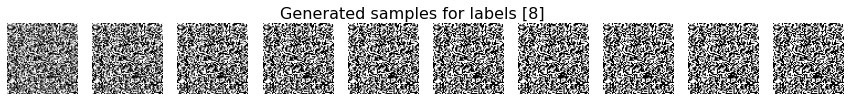

Training:  18%|█▊        | 99/546 [00:06<00:24, 18.30it/s]


Epoch 1 | step 100/546 | loss 0.70890468


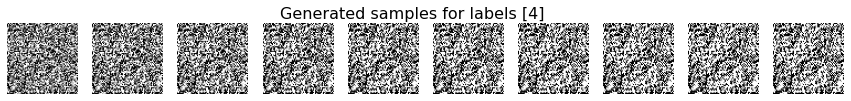

Training:  36%|███▋      | 199/546 [00:13<00:19, 17.39it/s]


Epoch 1 | step 200/546 | loss 0.42035645


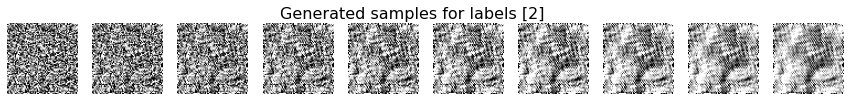

Training:  55%|█████▍    | 299/546 [00:20<00:14, 17.50it/s]


Epoch 1 | step 300/546 | loss 0.19303513


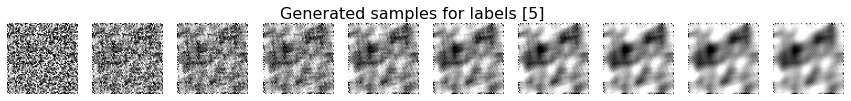

Training:  73%|███████▎  | 399/546 [00:27<00:08, 17.60it/s]


Epoch 1 | step 400/546 | loss 0.18665496


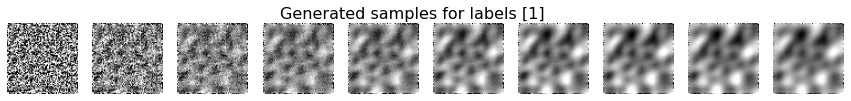

Training:  91%|█████████▏| 499/546 [00:34<00:02, 17.81it/s]


Epoch 1 | step 500/546 | loss 0.12916735


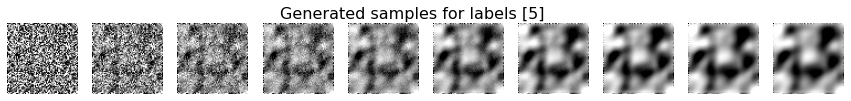

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 2 | step 0/546 | loss 0.12865210


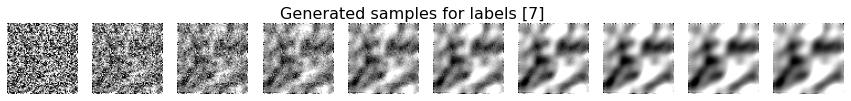

Training:  18%|█▊        | 99/546 [00:06<00:25, 17.72it/s]


Epoch 2 | step 100/546 | loss 0.12564903


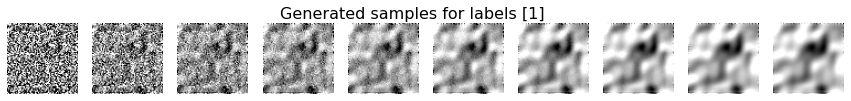

Training:  36%|███▋      | 199/546 [00:14<00:19, 17.76it/s]


Epoch 2 | step 200/546 | loss 0.13922331


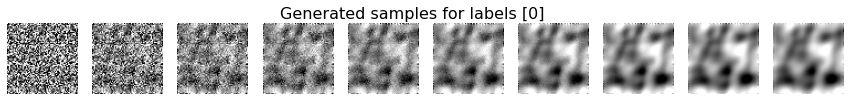

Training:  55%|█████▍    | 299/546 [00:21<00:14, 17.52it/s]


Epoch 2 | step 300/546 | loss 0.11691102


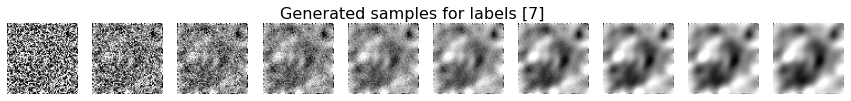

Training:  73%|███████▎  | 399/546 [00:28<00:08, 17.39it/s]


Epoch 2 | step 400/546 | loss 0.11729930


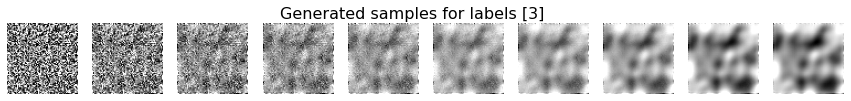

Training:  91%|█████████▏| 499/546 [00:35<00:02, 17.21it/s]


Epoch 2 | step 500/546 | loss 0.13365923


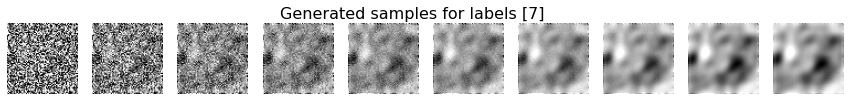

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 3 | step 0/546 | loss 0.12717554


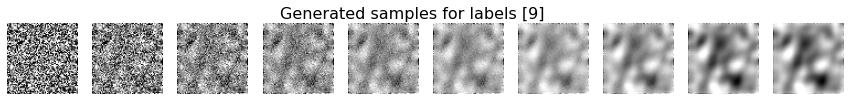

Training:  18%|█▊        | 99/546 [00:06<00:25, 17.34it/s]


Epoch 3 | step 100/546 | loss 0.10903487


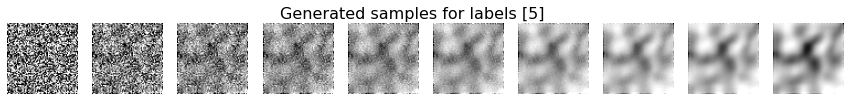

Training:  36%|███▋      | 199/546 [00:14<00:20, 17.01it/s]


Epoch 3 | step 200/546 | loss 0.11177965


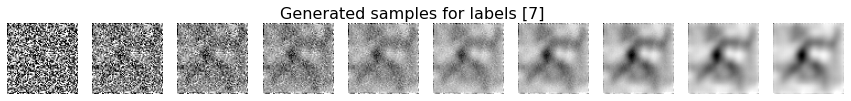

Training:  55%|█████▍    | 299/546 [00:21<00:14, 16.91it/s]


Epoch 3 | step 300/546 | loss 0.08742593


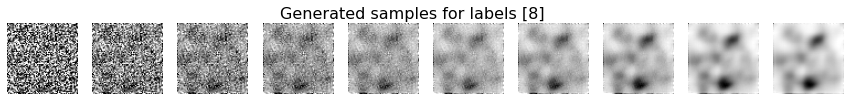

Training:  73%|███████▎  | 399/546 [00:28<00:08, 16.76it/s]


Epoch 3 | step 400/546 | loss 0.09210976


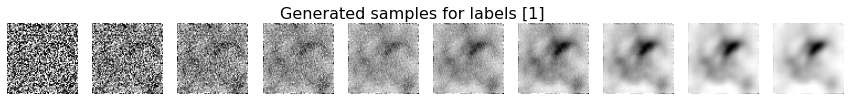

Training:  91%|█████████▏| 499/546 [00:35<00:02, 16.92it/s]


Epoch 3 | step 500/546 | loss 0.06590870


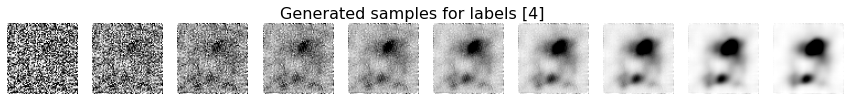

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 4 | step 0/546 | loss 0.08778830


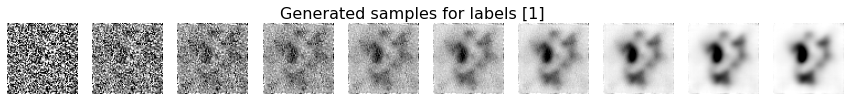

Training:  18%|█▊        | 99/546 [00:07<00:26, 16.65it/s]


Epoch 4 | step 100/546 | loss 0.08815832


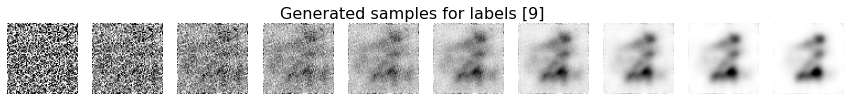

Training:  36%|███▋      | 199/546 [00:14<00:20, 16.79it/s]


Epoch 4 | step 200/546 | loss 0.09016090


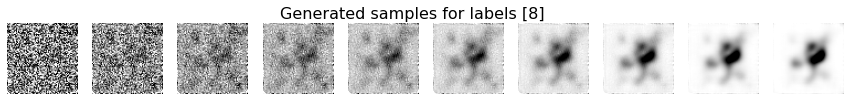

Training:  55%|█████▍    | 299/546 [00:21<00:14, 16.85it/s]


Epoch 4 | step 300/546 | loss 0.04517429


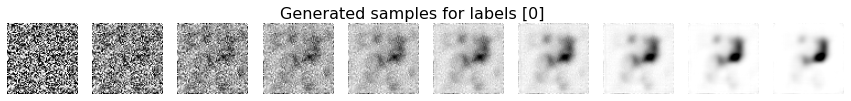

Training:  73%|███████▎  | 399/546 [00:29<00:08, 16.60it/s]


Epoch 4 | step 400/546 | loss 0.08832012


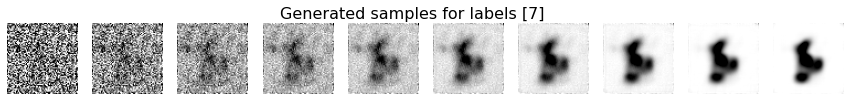

Training:  91%|█████████▏| 499/546 [00:36<00:02, 16.56it/s]


Epoch 4 | step 500/546 | loss 0.05756765


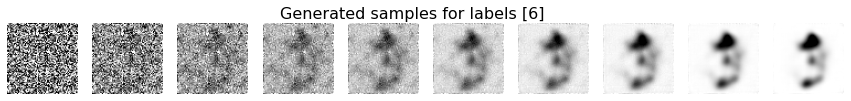

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 5 | step 0/546 | loss 0.07116276


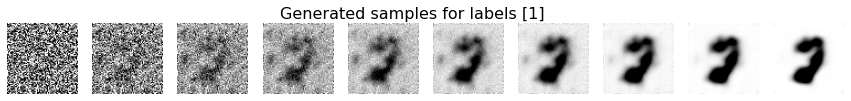

Training:  18%|█▊        | 99/546 [00:07<00:27, 15.99it/s]


Epoch 5 | step 100/546 | loss 0.06516664


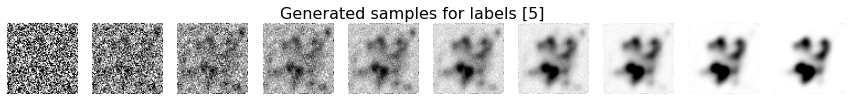

Training:  36%|███▋      | 199/546 [00:14<00:20, 16.67it/s]


Epoch 5 | step 200/546 | loss 0.06829911


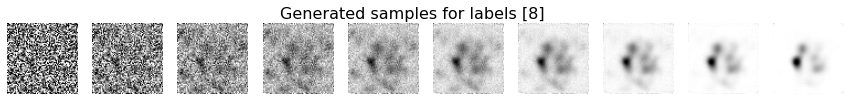

Training:  55%|█████▍    | 299/546 [00:21<00:14, 16.71it/s]


Epoch 5 | step 300/546 | loss 0.05526028


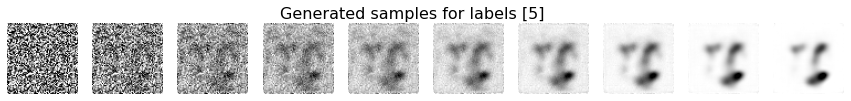

Training:  73%|███████▎  | 399/546 [00:29<00:09, 16.28it/s]


Epoch 5 | step 400/546 | loss 0.07006162


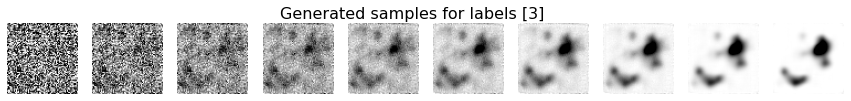

Training:  91%|█████████▏| 499/546 [00:36<00:02, 16.73it/s]


Epoch 5 | step 500/546 | loss 0.07367687


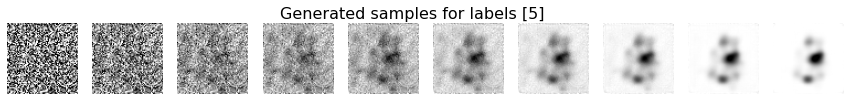

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 6 | step 0/546 | loss 0.07017572


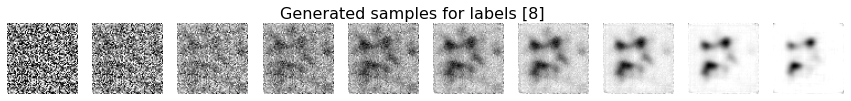

Training:  18%|█▊        | 99/546 [00:07<00:27, 16.37it/s]


Epoch 6 | step 100/546 | loss 0.05072985


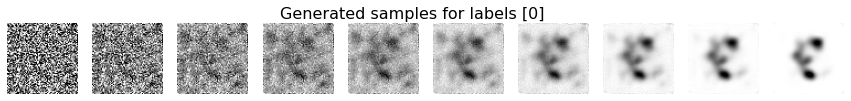

Training:  36%|███▋      | 199/546 [00:14<00:21, 16.41it/s]


Epoch 6 | step 200/546 | loss 0.05821593


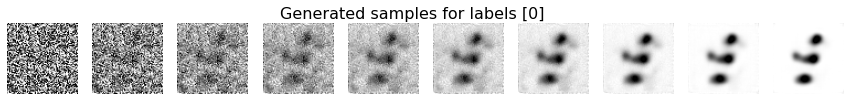

Training:  55%|█████▍    | 299/546 [00:21<00:14, 16.60it/s]


Epoch 6 | step 300/546 | loss 0.05583450


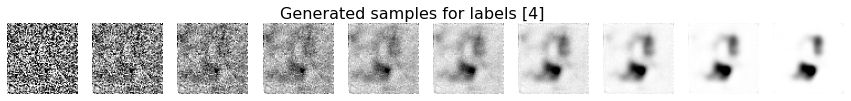

Training:  73%|███████▎  | 399/546 [00:29<00:09, 16.29it/s]


Epoch 6 | step 400/546 | loss 0.07512630


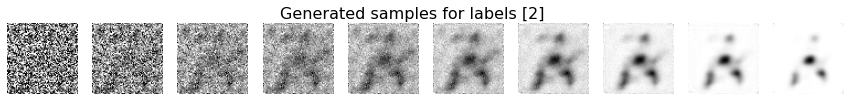

Training:  91%|█████████▏| 499/546 [00:36<00:02, 15.98it/s]


Epoch 6 | step 500/546 | loss 0.05878613


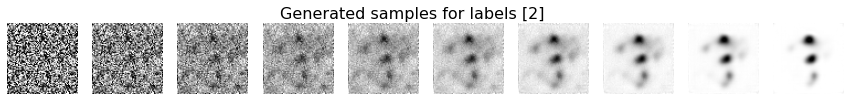

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 7 | step 0/546 | loss 0.05192485


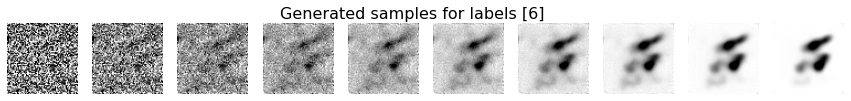

Training:  18%|█▊        | 99/546 [00:07<00:27, 16.51it/s]


Epoch 7 | step 100/546 | loss 0.05461825


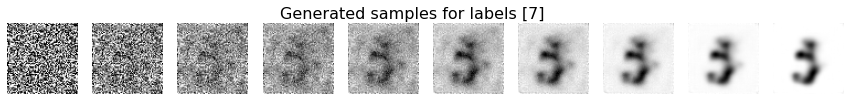

Training:  36%|███▋      | 199/546 [00:14<00:21, 16.34it/s]


Epoch 7 | step 200/546 | loss 0.06007576


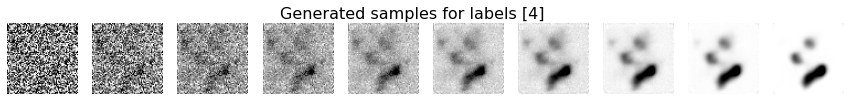

Training:  55%|█████▍    | 299/546 [00:22<00:15, 16.45it/s]


Epoch 7 | step 300/546 | loss 0.06198370


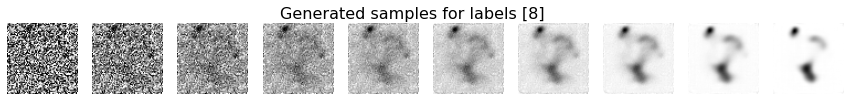

Training:  73%|███████▎  | 399/546 [00:29<00:09, 15.90it/s]


Epoch 7 | step 400/546 | loss 0.04730875


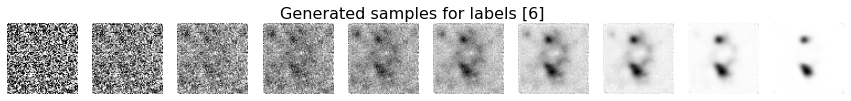

Training:  91%|█████████▏| 499/546 [00:37<00:02, 16.55it/s]


Epoch 7 | step 500/546 | loss 0.04015991


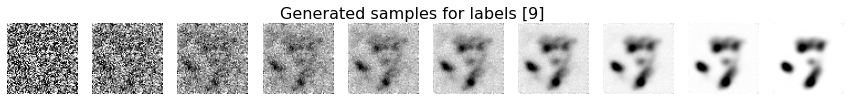

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 8 | step 0/546 | loss 0.04906096


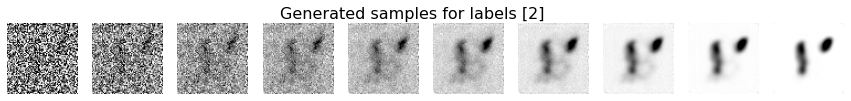

Training:  18%|█▊        | 99/546 [00:07<00:28, 15.90it/s]


Epoch 8 | step 100/546 | loss 0.06070298


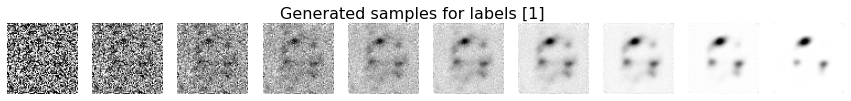

Training:  36%|███▋      | 199/546 [00:14<00:21, 16.47it/s]


Epoch 8 | step 200/546 | loss 0.06544012


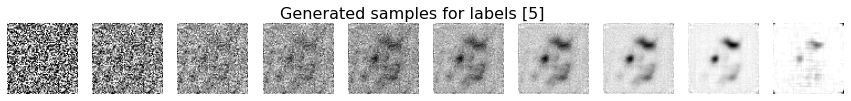

Training:  55%|█████▍    | 299/546 [00:22<00:15, 16.15it/s]


Epoch 8 | step 300/546 | loss 0.05290528


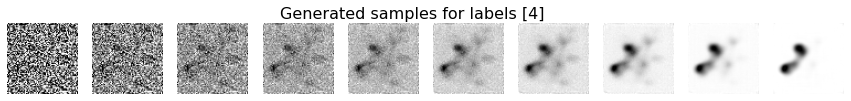

Training:  73%|███████▎  | 399/546 [00:29<00:09, 16.00it/s]


Epoch 8 | step 400/546 | loss 0.05398580


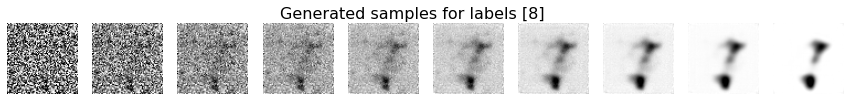

Training:  91%|█████████▏| 499/546 [00:37<00:03, 15.29it/s]


Epoch 8 | step 500/546 | loss 0.04625893


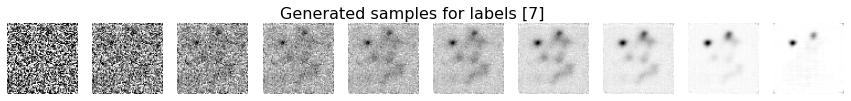

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 9 | step 0/546 | loss 0.04447931


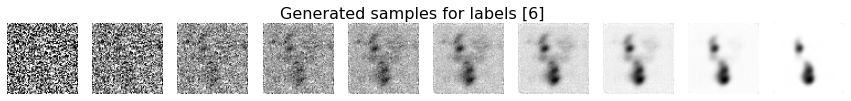

Training:  18%|█▊        | 99/546 [00:07<00:28, 15.90it/s]


Epoch 9 | step 100/546 | loss 0.06053288


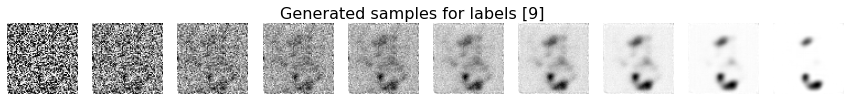

Training:  36%|███▋      | 199/546 [00:14<00:21, 16.48it/s]


Epoch 9 | step 200/546 | loss 0.04454422


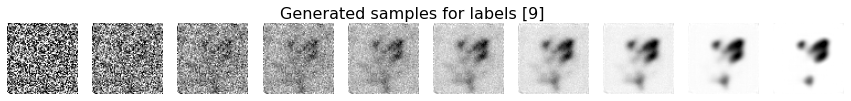

Training:  55%|█████▍    | 299/546 [00:22<00:15, 15.89it/s]


Epoch 9 | step 300/546 | loss 0.04283974


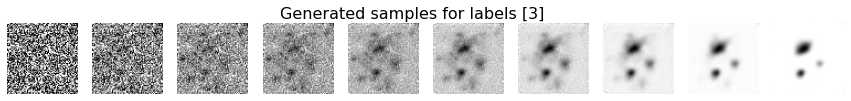

Training:  73%|███████▎  | 399/546 [00:29<00:09, 16.04it/s]


Epoch 9 | step 400/546 | loss 0.03714395


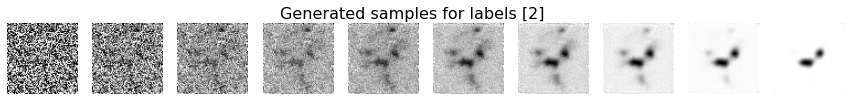

Training:  91%|█████████▏| 499/546 [00:37<00:03, 15.39it/s]


Epoch 9 | step 500/546 | loss 0.04209404


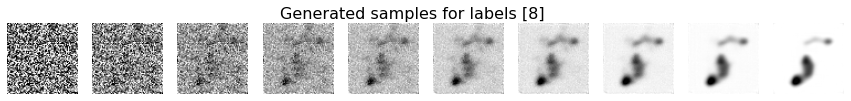

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 10 | step 0/546 | loss 0.07261278


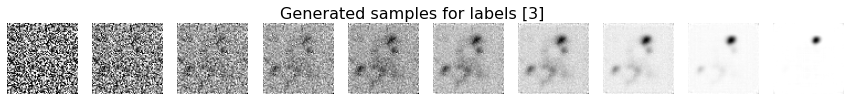

Training:  18%|█▊        | 99/546 [00:07<00:29, 15.26it/s]


Epoch 10 | step 100/546 | loss 0.05181626


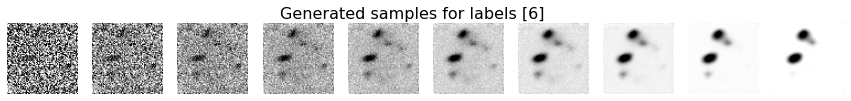

Training:  36%|███▋      | 199/546 [00:16<00:22, 15.55it/s]


Epoch 10 | step 200/546 | loss 0.06064526


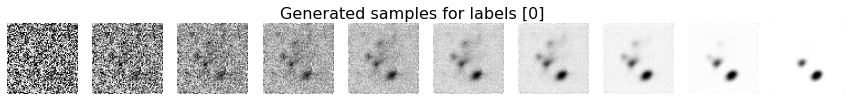

Training:  55%|█████▍    | 299/546 [00:23<00:15, 15.70it/s]


Epoch 10 | step 300/546 | loss 0.05206637


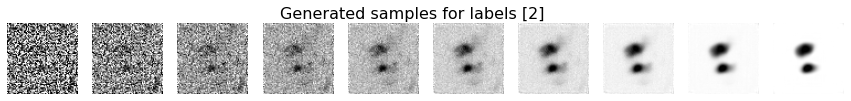

Training:  73%|███████▎  | 399/546 [00:31<00:09, 15.16it/s]


Epoch 10 | step 400/546 | loss 0.03805344


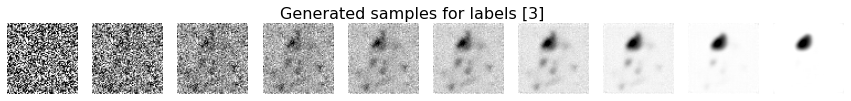

Training:  91%|█████████▏| 499/546 [00:39<00:03, 15.21it/s]


Epoch 10 | step 500/546 | loss 0.04835234


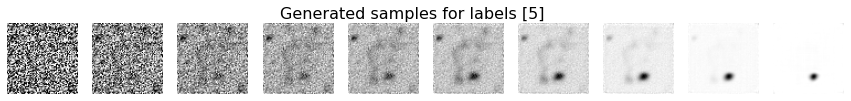

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 11 | step 0/546 | loss 0.04329965


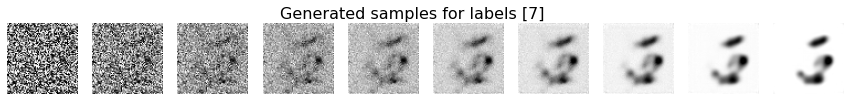

Training:  18%|█▊        | 99/546 [00:08<00:29, 14.97it/s]


Epoch 11 | step 100/546 | loss 0.04087950


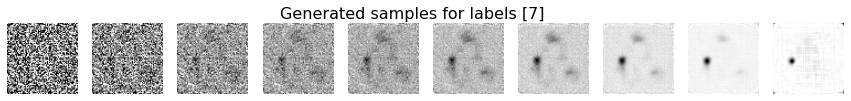

Training:  36%|███▋      | 199/546 [00:15<00:22, 15.09it/s]


Epoch 11 | step 200/546 | loss 0.03946054


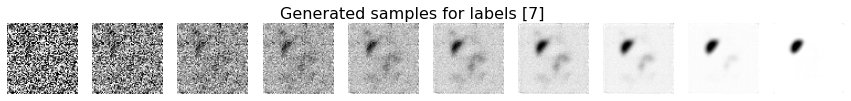

Training:  55%|█████▍    | 299/546 [00:24<00:17, 14.34it/s]


Epoch 11 | step 300/546 | loss 0.04014524


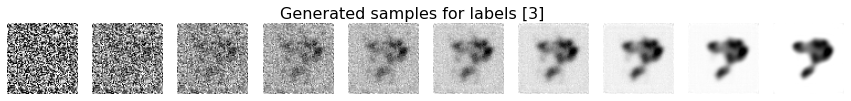

Training:  73%|███████▎  | 399/546 [00:32<00:10, 14.49it/s]


Epoch 11 | step 400/546 | loss 0.05933255


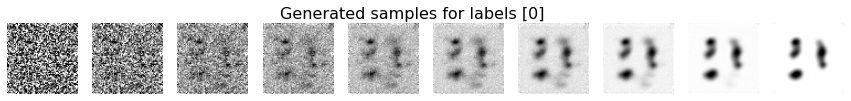

Training:  91%|█████████▏| 499/546 [00:40<00:03, 14.73it/s]


Epoch 11 | step 500/546 | loss 0.05925267


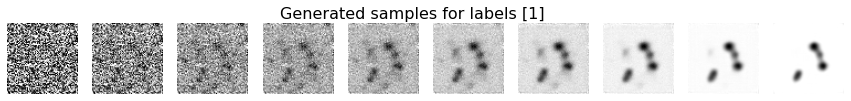

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 12 | step 0/546 | loss 0.04660577


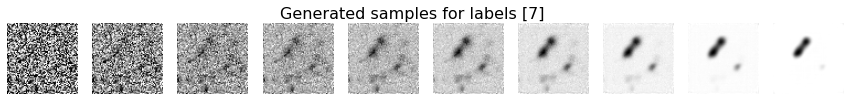

Training:  18%|█▊        | 99/546 [00:08<00:29, 15.05it/s]


Epoch 12 | step 100/546 | loss 0.04277503


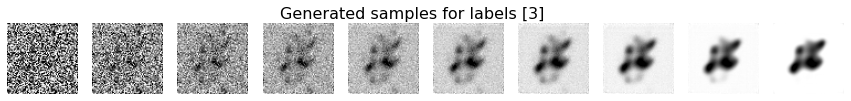

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.96it/s]


Epoch 12 | step 200/546 | loss 0.04043992


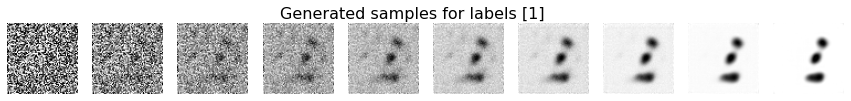

Training:  55%|█████▍    | 299/546 [00:23<00:16, 15.43it/s]


Epoch 12 | step 300/546 | loss 0.03224527


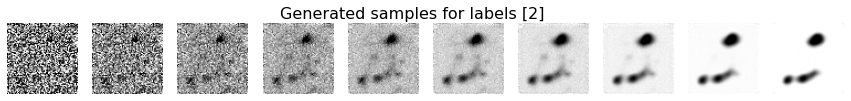

Training:  73%|███████▎  | 399/546 [00:31<00:09, 15.16it/s]


Epoch 12 | step 400/546 | loss 0.04410164


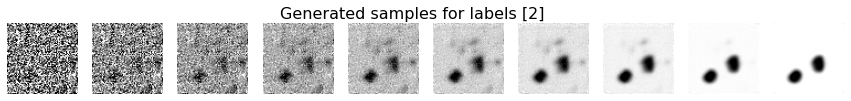

Training:  91%|█████████▏| 499/546 [00:39<00:03, 14.85it/s]


Epoch 12 | step 500/546 | loss 0.03950408


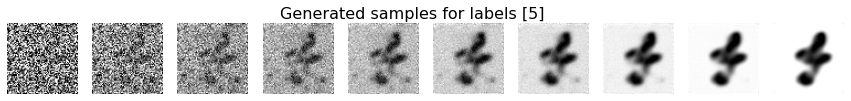

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 13 | step 0/546 | loss 0.03468252


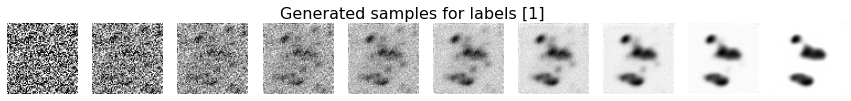

Training:  18%|█▊        | 99/546 [00:07<00:30, 14.65it/s]


Epoch 13 | step 100/546 | loss 0.05012576


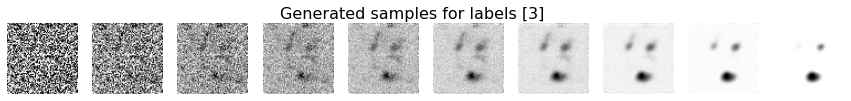

Training:  36%|███▋      | 199/546 [00:15<00:23, 15.02it/s]


Epoch 13 | step 200/546 | loss 0.04845580


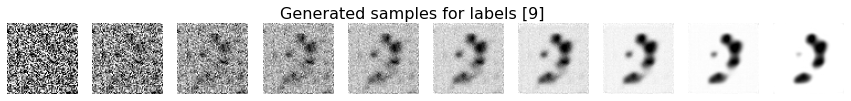

Training:  55%|█████▍    | 299/546 [00:24<00:16, 14.67it/s]


Epoch 13 | step 300/546 | loss 0.03755237


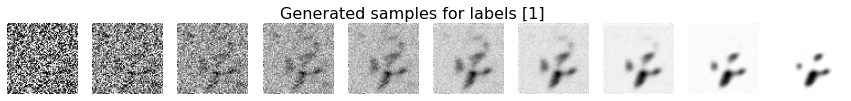

Training:  73%|███████▎  | 399/546 [00:32<00:09, 15.11it/s]


Epoch 13 | step 400/546 | loss 0.04474232


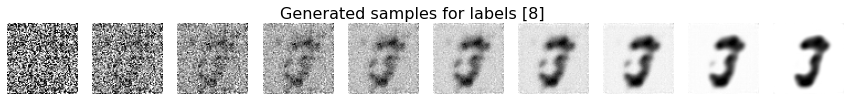

Training:  91%|█████████▏| 499/546 [00:40<00:03, 14.89it/s]


Epoch 13 | step 500/546 | loss 0.03372890


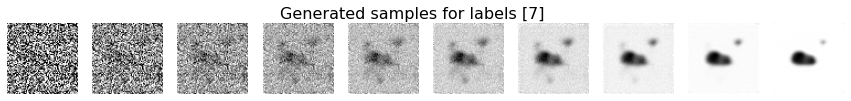

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 14 | step 0/546 | loss 0.03750626


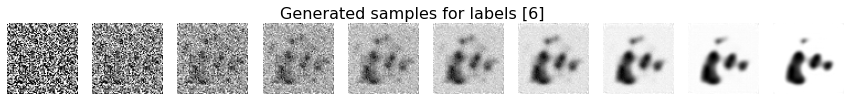

Training:  18%|█▊        | 99/546 [00:08<00:29, 14.91it/s]


Epoch 14 | step 100/546 | loss 0.04351299


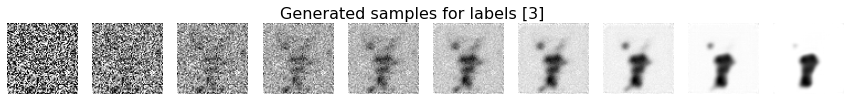

Training:  36%|███▋      | 199/546 [00:15<00:23, 15.04it/s]


Epoch 14 | step 200/546 | loss 0.03771973


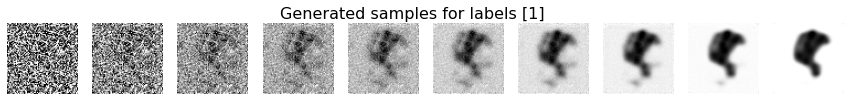

Training:  55%|█████▍    | 299/546 [00:23<00:16, 15.10it/s]


Epoch 14 | step 300/546 | loss 0.03615294


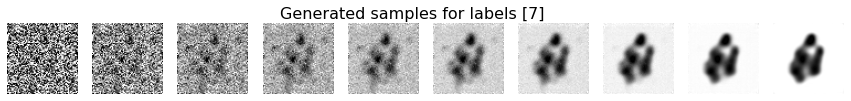

Training:  73%|███████▎  | 399/546 [00:31<00:09, 14.98it/s]


Epoch 14 | step 400/546 | loss 0.03014412


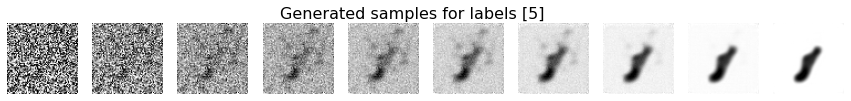

Training:  91%|█████████▏| 499/546 [00:39<00:03, 14.91it/s]


Epoch 14 | step 500/546 | loss 0.03610994


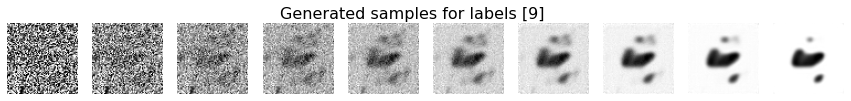

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 15 | step 0/546 | loss 0.03657754


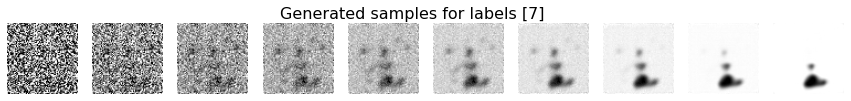

Training:  18%|█▊        | 99/546 [00:07<00:29, 15.09it/s]


Epoch 15 | step 100/546 | loss 0.04143245


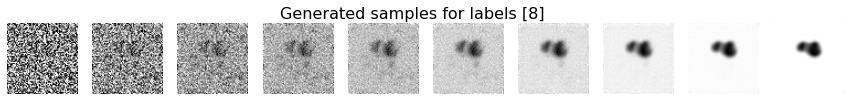

Training:  36%|███▋      | 199/546 [00:15<00:23, 14.77it/s]


Epoch 15 | step 200/546 | loss 0.03791703


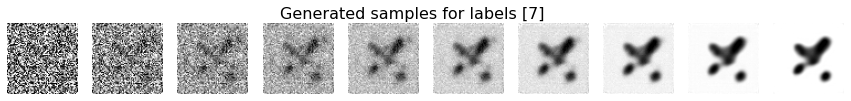

Training:  55%|█████▍    | 299/546 [00:24<00:16, 14.68it/s]


Epoch 15 | step 300/546 | loss 0.04159624


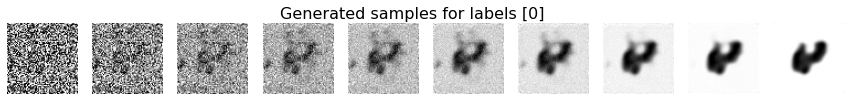

Training:  73%|███████▎  | 399/546 [00:32<00:09, 15.14it/s]


Epoch 15 | step 400/546 | loss 0.03579235


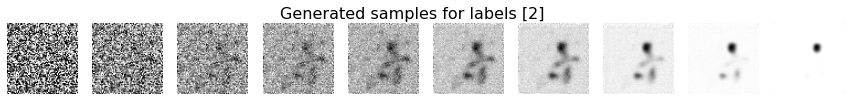

Training:  91%|█████████▏| 499/546 [00:40<00:03, 14.91it/s]


Epoch 15 | step 500/546 | loss 0.03667824


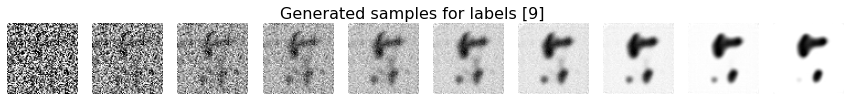

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 16 | step 0/546 | loss 0.04868442


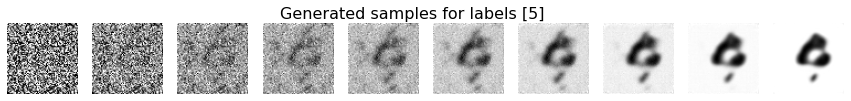

Training:  18%|█▊        | 99/546 [00:07<00:29, 14.98it/s]


Epoch 16 | step 100/546 | loss 0.04313192


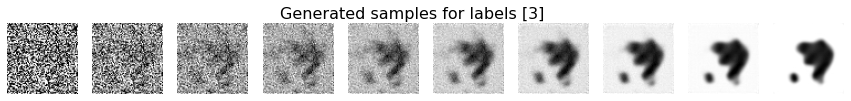

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.75it/s]


Epoch 16 | step 200/546 | loss 0.03045708


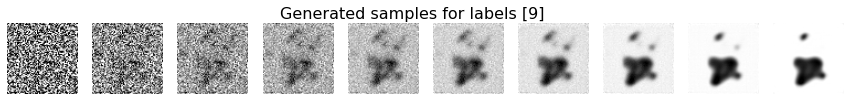

Training:  55%|█████▍    | 299/546 [00:24<00:16, 14.76it/s]


Epoch 16 | step 300/546 | loss 0.03016219


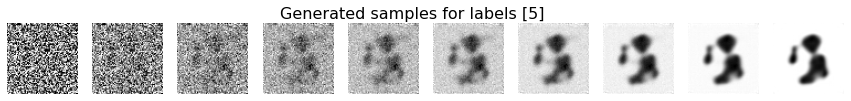

Training:  73%|███████▎  | 399/546 [00:32<00:10, 14.65it/s]


Epoch 16 | step 400/546 | loss 0.03329843


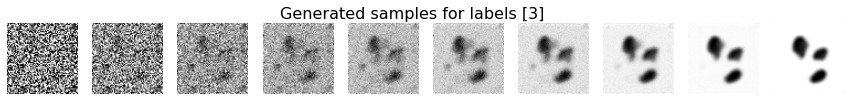

Training:  91%|█████████▏| 499/546 [00:40<00:03, 14.93it/s]


Epoch 16 | step 500/546 | loss 0.02997637


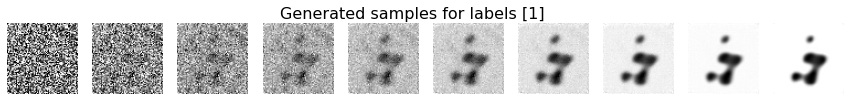

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 17 | step 0/546 | loss 0.03927172


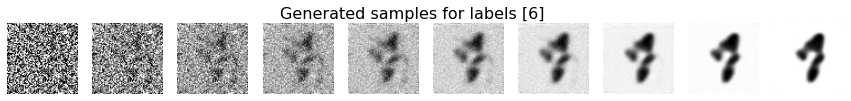

Training:  18%|█▊        | 99/546 [00:08<00:30, 14.73it/s]


Epoch 17 | step 100/546 | loss 0.02919796


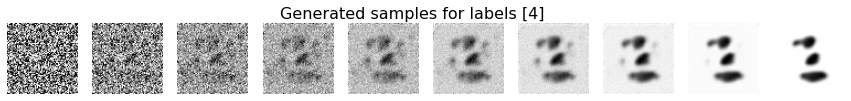

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.76it/s]


Epoch 17 | step 200/546 | loss 0.05803382


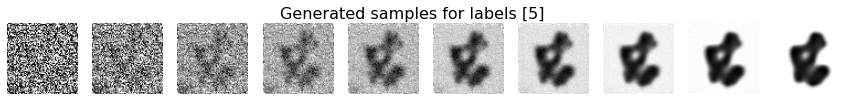

Training:  55%|█████▍    | 299/546 [00:24<00:17, 14.49it/s]


Epoch 17 | step 300/546 | loss 0.03910178


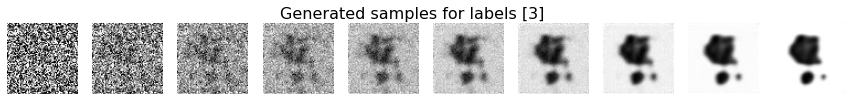

Training:  73%|███████▎  | 399/546 [00:32<00:10, 14.39it/s]


Epoch 17 | step 400/546 | loss 0.04222834


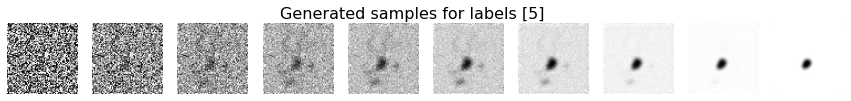

Training:  91%|█████████▏| 499/546 [00:41<00:03, 14.95it/s]


Epoch 17 | step 500/546 | loss 0.03801940


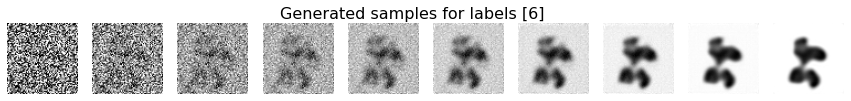

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 18 | step 0/546 | loss 0.03180128


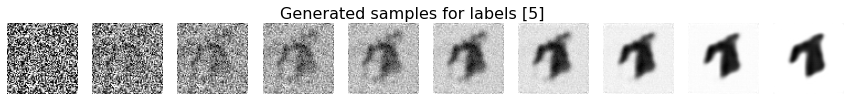

Training:  18%|█▊        | 99/546 [00:08<00:30, 14.55it/s]


Epoch 18 | step 100/546 | loss 0.04559601


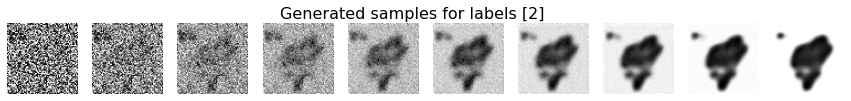

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.84it/s]


Epoch 18 | step 200/546 | loss 0.02727954


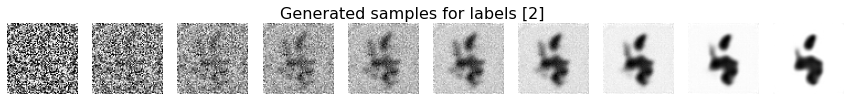

Training:  55%|█████▍    | 299/546 [00:24<00:17, 14.52it/s]


Epoch 18 | step 300/546 | loss 0.02601553


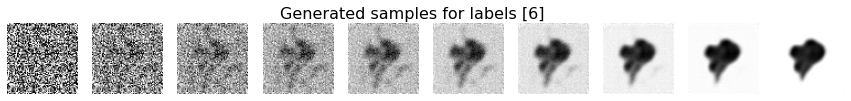

Training:  73%|███████▎  | 399/546 [00:33<00:09, 15.02it/s]


Epoch 18 | step 400/546 | loss 0.02841856


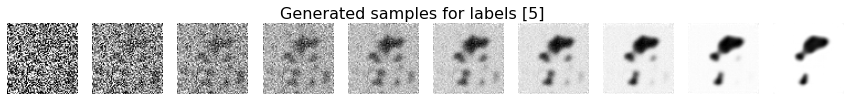

Training:  91%|█████████▏| 499/546 [00:41<00:03, 14.66it/s]


Epoch 18 | step 500/546 | loss 0.04276791


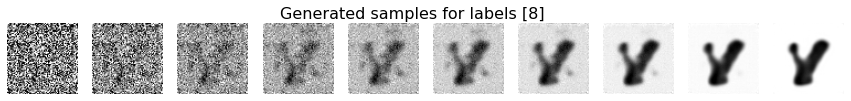

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 19 | step 0/546 | loss 0.04784856


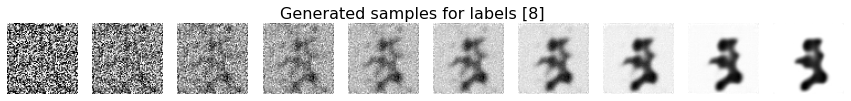

Training:  18%|█▊        | 99/546 [00:08<00:31, 14.33it/s]


Epoch 19 | step 100/546 | loss 0.02900385


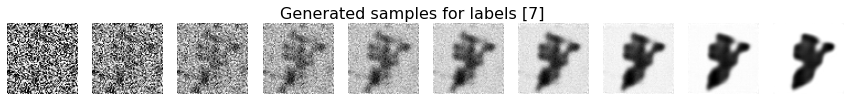

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.64it/s]


Epoch 19 | step 200/546 | loss 0.02981995


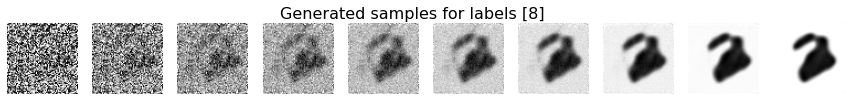

Training:  55%|█████▍    | 299/546 [00:25<00:16, 14.62it/s]


Epoch 19 | step 300/546 | loss 0.03985707


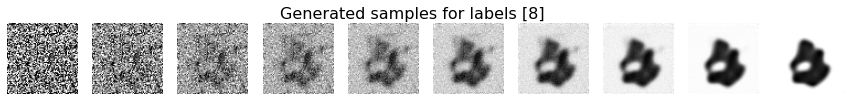

Training:  73%|███████▎  | 399/546 [00:33<00:10, 14.42it/s]


Epoch 19 | step 400/546 | loss 0.02864195


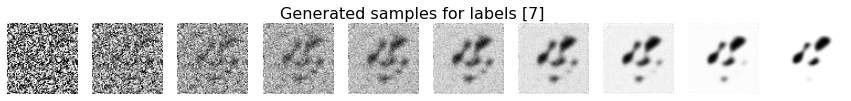

Training:  91%|█████████▏| 499/546 [00:42<00:03, 14.66it/s]


Epoch 19 | step 500/546 | loss 0.02590832


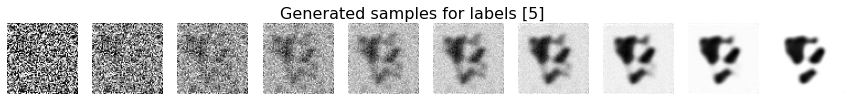

Training:   0%|          | 0/546 [00:00<?, ?it/s]


Epoch 20 | step 0/546 | loss 0.03633768


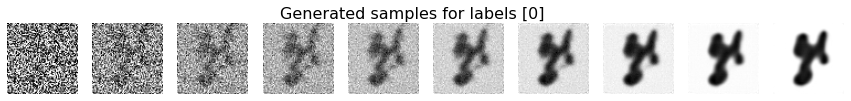

Training:  18%|█▊        | 99/546 [00:08<00:30, 14.70it/s]


Epoch 20 | step 100/546 | loss 0.04439057


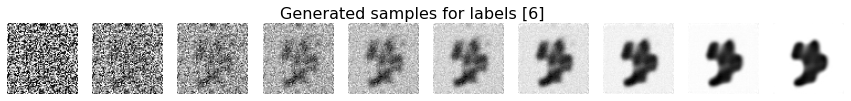

Training:  36%|███▋      | 199/546 [00:16<00:23, 14.88it/s]


Epoch 20 | step 200/546 | loss 0.04551908


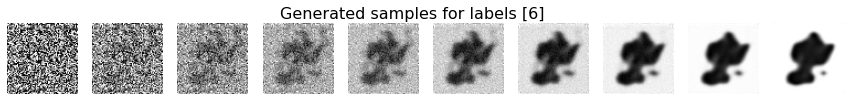

Training:  47%|████▋     | 259/546 [00:22<00:19, 14.52it/s]

In [ ]:
TEST_T = DEFAULT_T
# test_model = EpsDDPMSubTimeSampling(
test_model = EpsDDPM(
# test_model = AvgDDPM(
# test_model = DDIM(
  noise_model = LinearNoise(T=TEST_T),
  # denoiser = Unet(
  #   channels = [16, 32, 64, 128],
  #   time_emb_dim = 128, time_out_dim = 64,
  # ),
  denoiser = Variationalautoencoder2(end_skip=True, embeding_dim=16),
  # num_denoise_steps=20,
  # discriminator=discriminator,
  # cls_coeff = 1e-2,
  # loss='l1',
  # sampling_noise='beta',
  # sampling_noise=0.1,
  # sampling_noise='beta_tilde',
)
# test_model.load('unet-T400-3')

# show_fid(test_model)

train_loss = test_model.train(dataloader, optimizer=torch.optim.Adam,
  # epochs=10, lr=1e-3,
  epochs=30, lr=1e-4,
  # epochs=30, lr=1e-3,
)
plt.plot(train_loss)
plt.show()
model_name = f'autoencoder-eps'
test_model.save(model_name)
print(model_name)

show_end_samples(test_model, 10, 5)
test_model.show_generated_sample(n=7)
show_fid(test_model)

# print_fid_with(test_model, model_name)

# test_model.load('unet-small-1')
# train_loss = test_model.train(dataloader, optimizer=torch.optim.Adam,
#   epochs=10, lr=1e-4,
# )
# test_model.save('unet-small-2')
# plt.plot(train_loss)
# plt.show()
# print_fid_with(test_model, 'unet-small-2')

# print_fid_with(test_model, 'unet-ddpm1')
# print_fid_with(test_model, 'unet-ddpm2')

In [ ]:
# unet_ddpm_model.save('unet-l1-ddpm2')

In [ ]:
unet_ddim_model = DDIM(
  noise_model = unet_ddpm_model.noise_model,
  denoiser = unet_ddpm_model.denoiser,
  num_denoise_steps=1.0,
  discriminator=discriminator,
  cls_coeff = 1e-2,
)
unet_ddim_model.load('unet-ddpm2')
train_loss = unet_ddim_model.train(
  dataloader,
  epochs=50,
  optimizer=torch.optim.Adam,
  # lr=1e-3,
  lr=1e-4,
)
plt.plot(train_loss)
plt.show()

# unet_ddim_model.save('unet-ddpm?')

## Faster image generation

In [ ]:
unet_ddim_model = DDIM(
  noise_model = unet_ddpm_model.noise_model,
  denoiser = unet_ddpm_model.denoiser,
  num_denoise_steps=1.0,
  discriminator=discriminator,
  cls_coeff = 1e-2,
)
unet_ddim_model.load('unet-ddpm2')

print("===== Using DDIM =====")
unet_ddim_model.show_generated_sample(n=5)

print("==== Direct x0 generations ===")
def gen_x0_direct():
  xT0 = unet_ddim_model.sample_noisy_x(10)
  labels0 = torch.tensor([x for x in range(len(xT0))]).to(device)
  T_emb = torch.ones(len(xT0), device=device, dtype=int) * unet_ddim_model.T
  pred_noise_0 = unet_ddim_model.denoiser(xT0, T_emb, labels0)
  pred_x0_0 = unet_ddim_model.noise_model.predict_x0(xT0, T_emb, pred_noise_0)
  show_data_samples(pred_x0_0, max_by_line=10, title='Direct x0 generations (1 step)')
gen_x0_direct()
gen_x0_direct()
gen_x0_direct()

In [ ]:
unet_ddpm_sts_model = EpsDDPMSubTimeSampling(
  noise_model = LinearNoise(T=400),
  denoiser = Unet(
    channels = [16, 32, 64, 128],
    time_emb_dim = 128,
    time_out_dim = 64,
  ),
  discriminator=discriminator,
  num_denoise_steps=5,
  cls_coeff = 1e-2,
)
print(f"Using sub-sampling with EpsDDPMSubTimeSampling with {unet_ddpm_sts_model.num_denoise_steps} steps")
unet_ddpm_sts_model.load('unet-ddpm2')
unet_ddpm_sts_model.show_generated_sample(n=5,
  shown_steps=min(unet_ddpm_sts_model.num_denoise_steps, 10)
)

## Training experiments

In [ ]:
avg_ddpm_model = AvgDDPM(
  noise_model = LinearNoise(T=400),
  # denoiser = SimpleConvDenoiser(),
  denoiser = Autoencoder(end_skip=False, embeding_dim=16),
)
train_loss = avg_ddpm_model.train(
  dataloader,
  epochs=10,
  optimizer=torch.optim.Adam,
  lr=1e-3,
  log_interval=100,
)
plt.plot(train_loss)
plt.show()

In [ ]:
eps_ddpm_model = EpsDDPM(
  noise_model = LinearNoise(T=400),
  # denoiser = SimpleConvDenoiser(),
  denoiser = Autoencoder(end_skip=True, embeding_dim=16),
)
train_loss = eps_ddpm_model.train(
  dataloader,
  epochs=10,
  optimizer=torch.optim.Adam,
  lr=1e-4,
  log_interval=100,
)
plt.plot(train_loss)
plt.show()

In [ ]:
ddim_model = DDIM(
  noise_model = LinearNoise(T=400),
  denoiser = Autoencoder(end_skip=True, embeding_dim=16),
  num_denoise_steps=0.1,
)
train_loss = ddim_model.train(
  dataloader,
  epochs=10,
  optimizer=torch.optim.Adam,
  lr=1e-4,
  log_interval=100,
)
plt.plot(train_loss)
plt.show()

In [ ]:
x0 = sample_example
timesteps = torch.as_tensor([200] * len(x0), device=device)
noise, xt = eps_ddpm_model.noise_model.add_noise(x0, timesteps)
pred = eps_ddpm_model.denoiser(xt, timesteps)

print(noise.min(), noise.max(), noise.mean())
show_data_samples(x0)
show_data_samples(noise)
show_data_samples(xt)
show_data_samples(pred)

## Computing the FID


In [ ]:
# show_fid(avg_ddpm_model)
show_fid(unet_ddpm_model)

# Plotting curves